In [1]:
import numpy as np

import pandas as pd

from gtda.time_series import SingleTakensEmbedding   # Implement the sliding window and the time delay embedding method.

from ripser import ripser                            # The Ripser package is used to compute Persistent Homology.

import matplotlib.pyplot as plt


In [2]:
#                                                                                                                                   #
#  The takens_embedding method transforms a time series signal into a point cloud.                                                  #
#                                                                                                                                   #
#  The persistent_homology method is used to compute Persistent Homology and transforms a point cloudd into a persistence diagram.  #
#                                                                                                                                   #
#####################################################################################################################################

def takens_embedding(signal, embedding_dimension):
    
    embedder = SingleTakensEmbedding(parameters_type = "fixed", dimension = embedding_dimension)
    
    point_cloud = embedder.fit_transform(signal)

    return point_cloud

def persistent_homology(point_cloud):
    
    persistent_diagram = ripser(point_cloud)['dgms']

    return persistent_diagram 


# Two Reversed Sequential Data

first array： [ 7 15 11  8  7 19 11 11  4  8  3  2 12  6  2  1 12 12 17 10]
second array： [10 17 12 12  1  2  6 12  2  3  8  4 11 11 19  7  8 11 15  7]


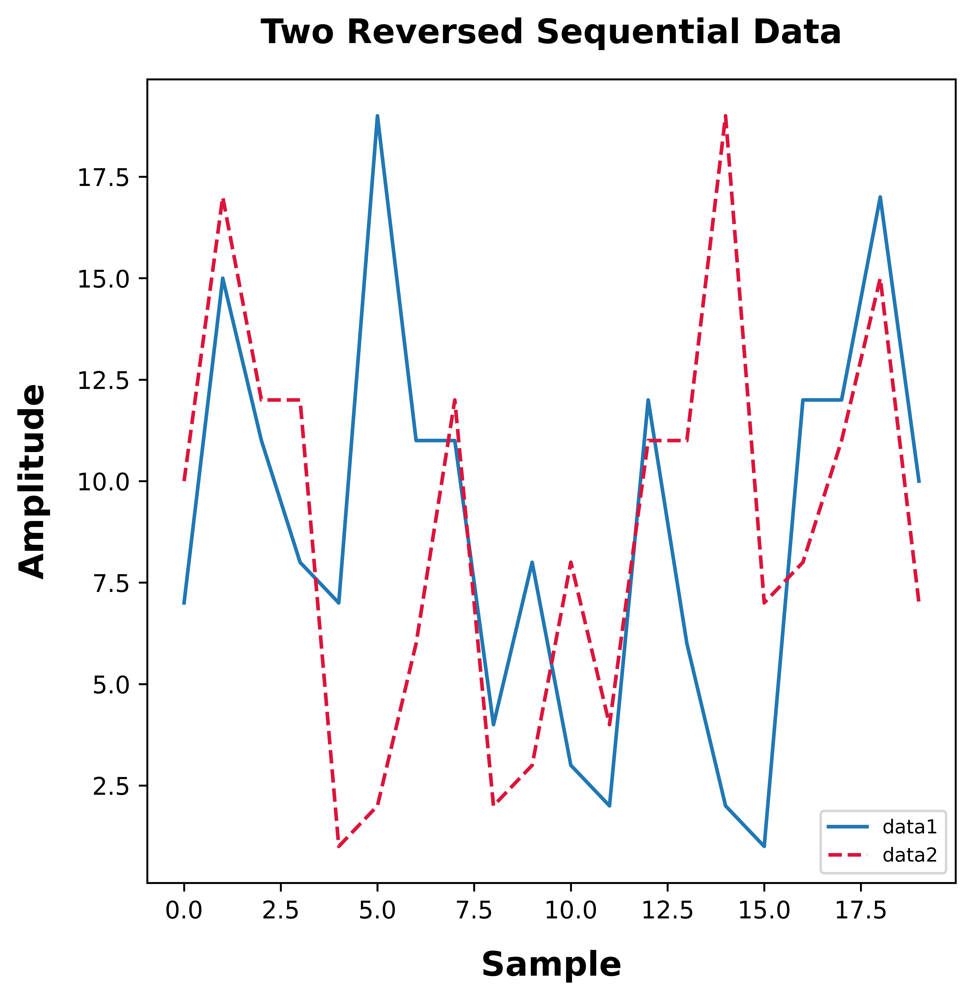

In [4]:
np.random.seed(42)

seq1 = np.random.randint(1, 20, 20)   # Two Reversed Sequential Data with 20 data points.

print('first array：', seq1)

seq2 = seq1[::-1]

print('second array：', seq2)

plt.figure(figsize = (6, 6), dpi = 1000)

plt.plot(seq1, label = 'data1', color = '#2078b4')
plt.plot(seq2, label = 'data2', color = '#DC143B', linestyle = '--')

plt.legend(loc = "lower right", fontsize = 8)

plt.title('Two Reversed Sequential Data', fontsize = 14, pad = 15, fontweight = 'bold')

plt.xlabel('Sample', fontsize = 14, labelpad = 11, fontweight = 'bold')

plt.ylabel('Amplitude', fontsize = 14, labelpad = 11, fontweight = 'bold')

plt.savefig('../../images/2_arrays.png', bbox_inches = 'tight', dpi = 1000)

plt.show()


# Point Cloud Diagram of Two Reversed Sequential Data

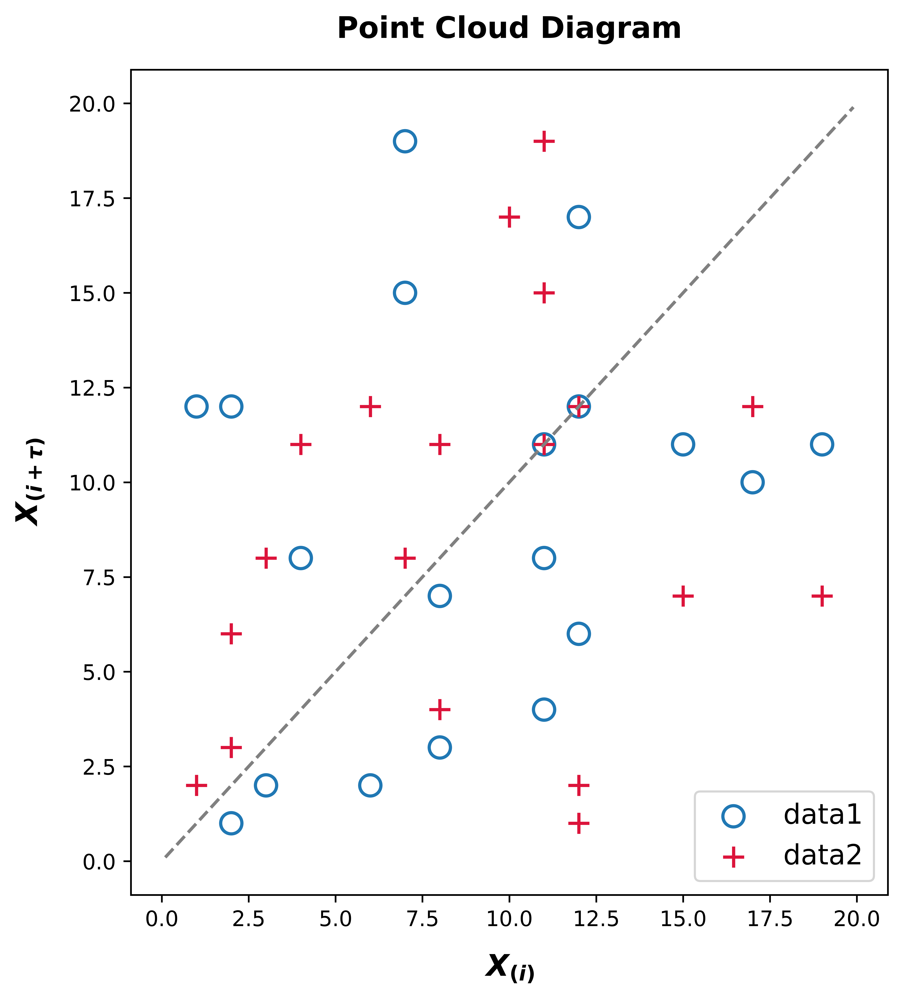

In [6]:
aa = takens_embedding(seq1, embedding_dimension = 2)

bb = takens_embedding(seq2, embedding_dimension = 2)

plt.figure(figsize = (6, 6), dpi = 1000)

plt.scatter(aa[:, 0], aa[:, 1], color = '#2078b4', marker = 'o', facecolors = 'none', label = 'data1', s = 100, linewidth = 1.5)

xmin, xmax, ymin, ymax = plt.axis()

plt.plot([xmin, xmax], [ymin, ymax], color = 'grey', linestyle = '--') 

plt.scatter(bb[:, 0], bb[:, 1], color = '#DC143B', marker = '+', label = 'data2' , s = 100)

plt.xlabel(r'$\mathbf{\boldsymbol{X}_{(\boldsymbol{i})}}$', fontsize = 14, labelpad = 11)

plt.ylabel(r'$\mathbf{\boldsymbol{X}_{(\boldsymbol{i}+\boldsymbol{\tau})}}$', fontsize = 14, labelpad = 11)

plt.title('Point Cloud Diagram', fontsize = 14, pad = 15, fontweight = 'bold')

plt.legend(loc = 'lower right', fontsize = 13)

plt.subplots_adjust(right = 0.95, top = 0.95, bottom = 0.05)

plt.savefig('../../images/2_arrays_point_cloud.png', bbox_inches = 'tight', dpi = 1000)

plt.show()

# Persistence Diagram of Two Reversed Sequential Data

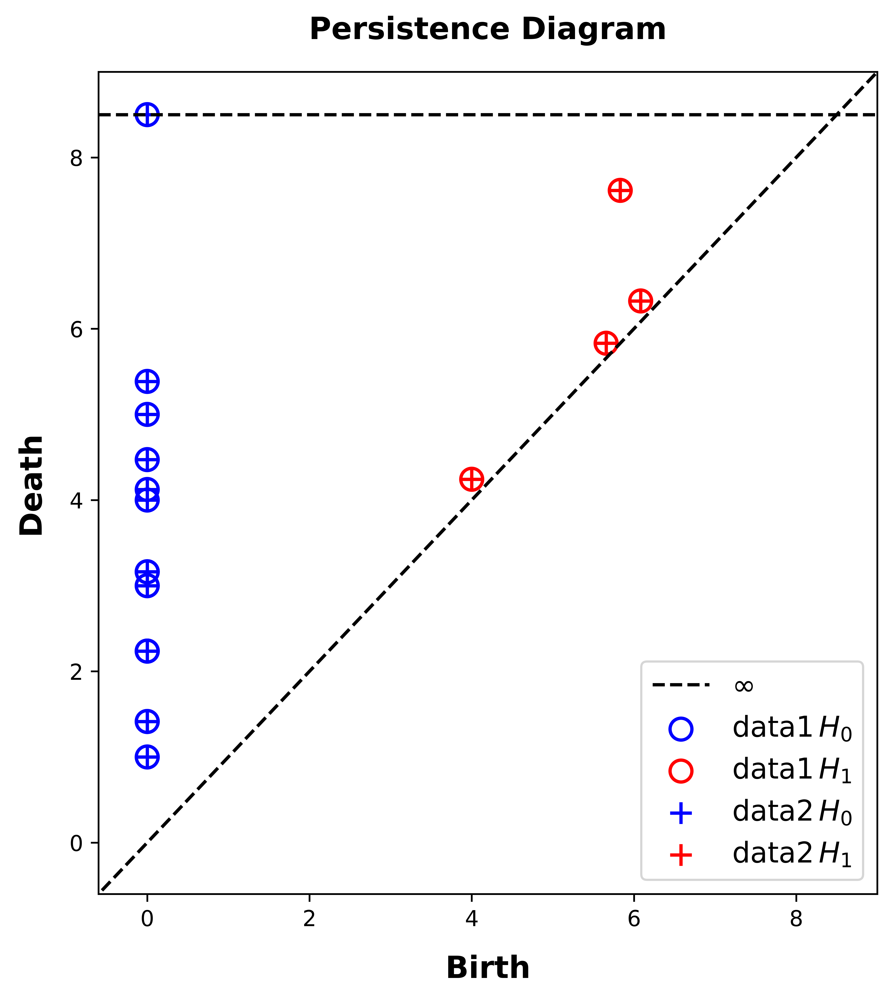

In [8]:
aaa = persistent_homology(aa)

bbb = persistent_homology(bb)

plt.figure(figsize = (6, 6), dpi = 1000)

x = np.linspace(-1, 9, 100)

plt.plot(x, x, 'k--', label = r'$\infty$')  

data1_h0 = r'$\mathrm{data1 } \, H_{0}$'

data1_h1 = r'$\mathrm{data1 } \, H_{1}$'

marker1 = 'o'

size1 = 100

plt.scatter(aaa[0][:, 0], aaa[0][:, 1], color = 'blue', marker = marker1, facecolors = 'none', label = data1_h0, s = size1, linewidth = 1.5)

plt.scatter(0, 8.5, color = 'blue', marker = marker1, facecolors = 'none', s = size1, linewidth = 1.5)

plt.scatter(aaa[1][:, 0], aaa[1][:, 1], color = 'red', marker = marker1, facecolors = 'none', label = data1_h1, s = size1, linewidth = 1.5)

data2_h0 = r'$\mathrm{data2 } \, H_{0}$'

data2_h1 = r'$\mathrm{data2 } \, H_{1}$'

marker2 = '+'

size2 = 100

plt.scatter(bbb[0][:, 0], bbb[0][:, 1], color = 'blue', marker = marker2, label = data2_h0, s = size2)

plt.scatter(0, 8.5, color = 'blue', marker = marker2, s = size2)

plt.scatter(bbb[1][:, 0], bbb[1][:, 1], color = 'red', marker = marker2, label = data2_h1, s = size2)

plt.axhline(y = 8.5, color = 'k', linestyle = '--') 

plt.legend(loc = 'lower right', fontsize = 13)

plt.xlabel('Birth', labelpad = 11, fontweight = 'bold', fontsize = 14)

plt.ylabel('Death', labelpad = 11, fontweight = 'bold', fontsize = 14)

plt.title("Persistence Diagram", fontsize = 14, pad = 15, fontweight = 'bold')

plt.xlim(-0.6, 9)

plt.ylim(-0.6, 9)

plt.subplots_adjust(right = 0.95, top = 0.95, bottom = 0.08)

plt.savefig('../../images/2_arrays_persistence_diagram.png', bbox_inches = 'tight', dpi = 1000)

plt.show()

# Persistence diagrams of the first three Sliding Windows

In [10]:
def sliding_windows(signal, window_size):
    
    window = SingleTakensEmbedding(parameters_type = "fixed", dimension = window_size)
    
    sliding_windows = window.fit_transform(signal)
    
    return sliding_windows

In [11]:
window_size = 5 

seq1_allwindow = sliding_windows(seq1, window_size)

seq2_allwindow = sliding_windows(seq2, window_size)

In [12]:
seq1_cloud = [] 

seq2_cloud = [] 

for i in range(0, 3):
    
    seq1_cloud.append(takens_embedding(seq1_allwindow[i], embedding_dimension = 2))

for i in range(0, 3):
    
    seq2_cloud.append(takens_embedding(seq2_allwindow[i], embedding_dimension = 2))

In [13]:
seq1_pd = [] 

seq2_pd = [] 

for i in range(0, 3):
    
    seq1_pd.append(persistent_homology(seq1_cloud[i]))

for i in range(0, 3):
    
    seq2_pd.append(persistent_homology(seq2_cloud[i]))

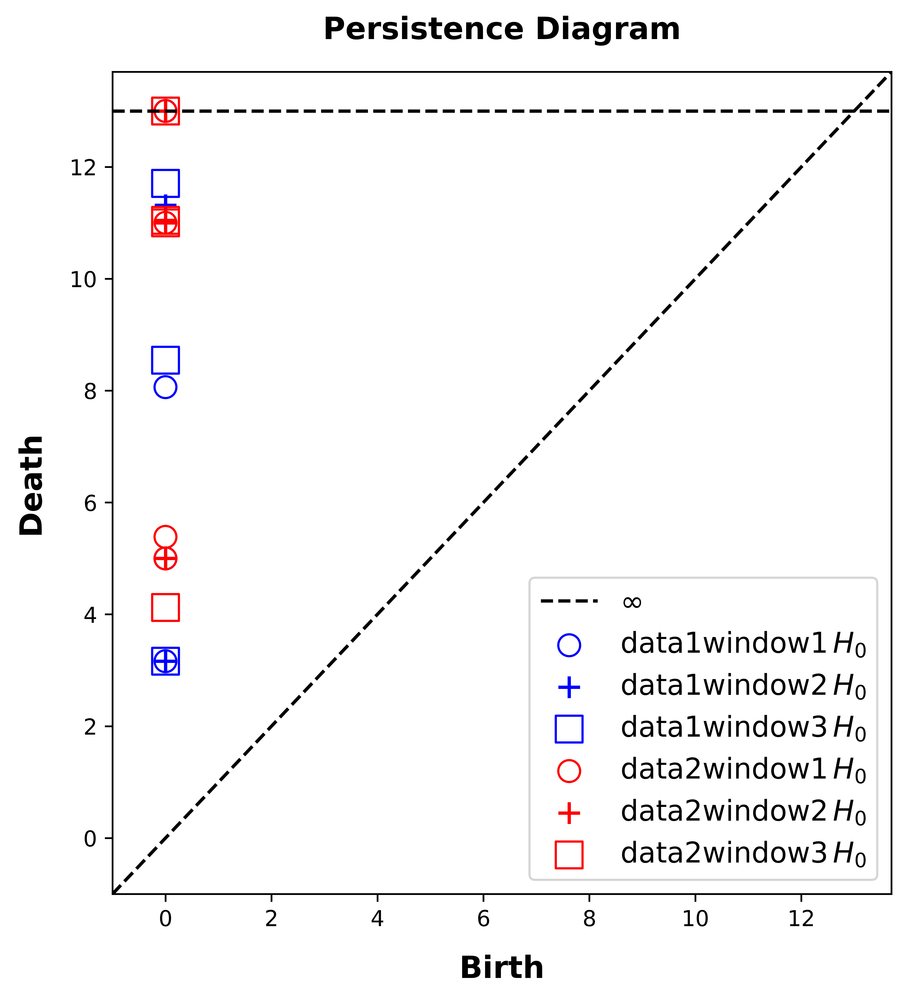

In [14]:
plt.figure(figsize = (6, 6), dpi = 1000)

x = np.linspace(-1, 13.7, 100)

plt.plot(x, x, 'k--', label = r'$\infty$') 

data1_h0 = r'$\mathrm{data1 window 1 } \, H_{0}$'

data2_h0 = r'$\mathrm{data1 window 2 } \, H_{0}$'

data3_h0 = r'$\mathrm{data1 window 3 } \, H_{0}$'

marker1 = 'o'

marker2 = '+'

marker3 = 's'

size1 = 100

size2 = 150

plt.scatter(seq1_pd[0][0][:, 0], seq1_pd[0][0][:, 1], color = 'blue', marker = marker1, facecolors = 'none', label = data1_h0, s = size1)

plt.scatter(seq1_pd[1][0][:, 0], seq1_pd[1][0][:, 1], color = 'blue', marker = marker2, label = data2_h0, s = size1)

plt.scatter(seq1_pd[2][0][:, 0], seq1_pd[2][0][:, 1], color = 'blue', marker = marker3, facecolors = 'none', label = data3_h0, s = size2)

plt.scatter(0, 13, color = 'blue', marker = marker1, facecolors = 'none', s = size1)

plt.scatter(0, 13, color = 'blue', marker = marker2, s = size1)

plt.scatter(0, 13, color = 'blue', marker = marker3, facecolors = 'none', s = size2)

data4_h0 = r'$\mathrm{data2 window 1 } \, H_{0}$'

data5_h0 = r'$\mathrm{data2 window 2 } \, H_{0}$'

data6_h0 = r'$\mathrm{data2 window 3 } \, H_{0}$'

plt.scatter(seq2_pd[0][0][:, 0], seq2_pd[0][0][:, 1], color = 'red', marker = marker1, facecolors = 'none', label = data4_h0, s = size1)

plt.scatter(seq2_pd[1][0][:, 0], seq2_pd[1][0][:, 1], color = 'red', marker = marker2, label = data5_h0, s = size1)

plt.scatter(seq2_pd[2][0][:, 0], seq2_pd[2][0][:, 1], color = 'red', marker = marker3, facecolors = 'none', label = data6_h0, s = size2)

plt.scatter(0, 13, color = 'red', marker = marker1, facecolors = 'none', s = size1)

plt.scatter(0, 13, color = 'red', marker = marker2, s = size1)

plt.scatter(0, 13, color = 'red', marker = marker3, facecolors = 'none', s = size2)

plt.axhline(y = 13, color = 'k', linestyle = '--')  

plt.legend(loc = 'lower right', fontsize = 13)

plt.xlabel('Birth', labelpad = 11, fontweight = 'bold', fontsize = 14)

plt.ylabel('Death', labelpad = 11, fontweight = 'bold', fontsize = 14)

plt.title("Persistence Diagram", fontsize = 14, pad = 15, fontweight = 'bold')

plt.xlim(-1, 13.7)

plt.ylim(-1, 13.7)

plt.subplots_adjust(right = 0.95, top = 0.95, bottom = 0.08)

plt.savefig('../../images/2_arrays_sliding_windows_persistence_diagram.png', bbox_inches = 'tight', dpi = 1000)

plt.show()

# Eight plots merged together

In [16]:
plt.figure(figsize = (16, 32), dpi = 1000)

plt.subplot(4, 2, 1) ####################################################################################################################

x = np.linspace(0, 2 * np.pi, 25)  

sin_y = np.sin(x)  

cos_y = np.cos(x) 

plt.plot(x, sin_y, label = 'Sin(x)', color = '#ea2a8b')

plt.plot(x, cos_y, label = 'Cos(x)', color = '#1e9a73', linestyle = '--')

plt.title('Sin(x) & Cos(x) Sequential Data', fontsize = 14, pad = 15, fontweight = 'bold')

plt.xlabel('Sample', fontsize = 14, labelpad = 11, fontweight = 'bold')

plt.ylabel('Amplitude', fontsize = 14, labelpad = 11, fontweight = 'bold')

plt.legend()

plt.subplot(4, 2, 2) ####################################################################################################################

plt.plot(seq1, label = 'data1', color = '#2078b4')

plt.plot(seq2, label = 'data2', color = '#DC143B', linestyle = '--')

plt.title('Two Reversed Sequential Data', fontsize = 14, pad = 15, fontweight = 'bold')

plt.xlabel('Sample', fontsize = 14, labelpad = 11, fontweight = 'bold')

plt.ylabel('Amplitude', fontsize = 14, labelpad = 11, fontweight = 'bold')

plt.legend(loc = "lower right", fontsize = 8)

plt.subplot(4, 2, 3) ####################################################################################################################

sin_point_cloud = takens_embedding(sin_y, 2)

cos_point_cloud = takens_embedding(cos_y, 2)

plt.scatter(sin_point_cloud[:, 0], sin_point_cloud[:, 1], color = '#ea2a8b', marker = 'o', facecolors = 'none', label = 'Sin(x)', s = 100, linewidth = 1.5)

plt.scatter(cos_point_cloud[:, 0], cos_point_cloud[:, 1], color = '#1e9a73', marker = '+', label = 'Cos(x)', s = 100)

plt.legend(loc = 'lower right', fontsize = 13)

plt.title('Point Cloud Diagram', fontsize = 14, pad = 15, fontweight = 'bold')

plt.xlabel(r'$\mathbf{\boldsymbol{X}_{(\boldsymbol{i})}}$', fontsize = 14, labelpad = 11)

plt.ylabel(r'$\mathbf{\boldsymbol{X}_{(\boldsymbol{i}+\boldsymbol{\tau})}}$', fontsize = 14, labelpad = 11)

plt.subplot(4, 2, 4) ####################################################################################################################

plt.scatter(aa[:, 0], aa[:, 1], color = '#2078b4', marker = 'o', facecolors = 'none', label = 'data1', s = 100, linewidth = 1.5)

xmin, xmax, ymin, ymax = plt.axis()

plt.plot([xmin, xmax], [ymin, ymax], color = 'grey', linestyle = '--') 

plt.scatter(bb[:, 0], bb[:, 1], color = '#DC143B', marker = '+', label = 'data2' , s = 100)

plt.title('Point Cloud Diagram', fontsize = 14, pad = 15, fontweight = 'bold')

plt.xlabel(r'$\mathbf{\boldsymbol{X}_{(\boldsymbol{i})}}$', fontsize = 14, labelpad = 11)

plt.ylabel(r'$\mathbf{\boldsymbol{X}_{(\boldsymbol{i}+\boldsymbol{\tau})}}$', fontsize = 14, labelpad = 11)

plt.legend(loc = 'lower right', fontsize = 13)

plt.subplot(4, 2, 5) ####################################################################################################################

sin_pd = persistent_homology(sin_point_cloud)

cos_pd = persistent_homology(cos_point_cloud)

x = np.linspace(-1, 0.7, 100)

plt.plot(x, x, 'k--', label = r'$\infty$') 

data1_h0 = r'$\mathrm{Sin(x) } \, H_{0}$'

data1_h1 = r'$\mathrm{Sin(x) } \, H_{1}$'

marker1 = 'o'

size1 = 100

plt.scatter(sin_pd[0][:, 0], sin_pd[0][:, 1], color = 'blue', marker = marker1, facecolors = 'none', label = data1_h0, s = size1, linewidth = 1.5)

plt.scatter(0, 0.58, color = 'blue', marker = marker1, facecolors = 'none', s = size1, linewidth = 1.5)

plt.scatter(sin_pd[1][:, 0], sin_pd[1][:, 1], color = 'red', marker = marker1, facecolors = 'none', label = data1_h1, s = size1, linewidth = 1.5)

data2_h0 = r'$\mathrm{Cos(x) } \, H_{0}$'

data2_h1 = r'$\mathrm{Cos(x) } \, H_{1}$'

marker2 = '+'

size2 = 100

plt.scatter(cos_pd[0][:, 0], cos_pd[0][:, 1], color = 'blue', marker = marker2, label = data2_h0, s = size2)

plt.scatter(0, 0.58, color = 'blue', marker = marker2, s = size2)

plt.scatter(cos_pd[1][:, 0], cos_pd[1][:, 1], color = 'red', marker = marker2, label = data2_h1, s = size2)

plt.axhline(y = 0.58, color = 'k', linestyle = '--')  # 水平虛線

plt.legend(loc = 'lower right', fontsize = 13)

plt.title("Persistence Diagram", fontsize = 14, pad = 15, fontweight = 'bold')

plt.xlabel('Birth', labelpad=11, fontweight = 'bold', fontsize = 14)

plt.ylabel('Death', labelpad=11, fontweight = 'bold', fontsize = 14)

plt.xlim(-0.03, 0.61)

plt.ylim(-0.03, 0.61)

plt.subplot(4, 2, 6) ####################################################################################################################

x = np.linspace(-1, 9, 100)

plt.plot(x, x, 'k--', label = r'$\infty$')  

data1_h0 = r'$\mathrm{data1 } \, H_{0}$'

data1_h1 = r'$\mathrm{data1 } \, H_{1}$'

marker1 = 'o'

size1 = 100

plt.scatter(aaa[0][:, 0], aaa[0][:, 1], color = 'blue', marker = marker1, facecolors = 'none', label = data1_h0, s = size1, linewidth = 1.5)

plt.scatter(0, 8.5, color = 'blue', marker = marker1, facecolors = 'none', s = size1, linewidth = 1.5)

plt.scatter(aaa[1][:, 0], aaa[1][:, 1], color = 'red', marker = marker1, facecolors = 'none', label = data1_h1, s = size1, linewidth = 1.5)

data2_h0 = r'$\mathrm{data2 } \, H_{0}$'

data2_h1 = r'$\mathrm{data2 } \, H_{1}$'

marker2 = '+'

size2 = 100

plt.scatter(bbb[0][:, 0], bbb[0][:, 1], color = 'blue', marker = marker2, label = data2_h0, s = size2)

plt.scatter(0, 8.5, color = 'blue', marker = marker2, s = size2)

plt.scatter(bbb[1][:, 0], bbb[1][:, 1], color = 'red', marker = marker2, label = data2_h1, s = size2)

plt.axhline(y = 8.5, color = 'k', linestyle = '--') 

plt.legend(loc = 'lower right', fontsize = 13)

plt.title("Persistence Diagram", fontsize = 14, pad = 15, fontweight = 'bold')

plt.xlabel('Birth', labelpad = 11, fontweight = 'bold', fontsize = 14)

plt.ylabel('Death', labelpad = 11, fontweight = 'bold', fontsize = 14)

plt.xlim(-0.6, 9)

plt.ylim(-0.6, 9)

plt.subplot(4, 2, 7) ####################################################################################################################

window_size = 5 

signal = sin_y 

sin_allwindow = sliding_windows(signal, window_size)

signal = cos_y

cos_allwindow = sliding_windows(signal, window_size)

sin_cloud = [] 

cos_cloud = [] 

for i in range(0, 3):
    
    sin_cloud.append(takens_embedding(sin_allwindow[i], embedding_dimension = 2))

for i in range(0, 3):
    
    cos_cloud.append(takens_embedding(cos_allwindow[i], embedding_dimension = 2))

sin_pd = [] 

cos_pd = [] 

for i in range(0, 3):
    
    sin_pd.append(persistent_homology(sin_cloud[i]))

for i in range(0, 3):
    
    cos_pd.append(persistent_homology(cos_cloud[i]))

x = np.linspace(-1, 0.48, 100)

plt.plot(x, x, 'k--', label = r'$\infty$') 

data1_h0 = r'$\mathrm{Sin(x) window 1 } \, H_{0}$'

data2_h0 = r'$\mathrm{Sin(x) window 2 } \, H_{0}$'

data3_h0 = r'$\mathrm{Sin(x) window 3 } \, H_{0}$'

marker1 = 'o'

marker2 = '+'

marker3 = 's'

size1 = 100

size2 = 150

plt.scatter(sin_pd[0][0][:, 0], sin_pd[0][0][:, 1], color = 'blue', marker = marker1, facecolors = 'none', label = data1_h0, s = size1)

plt.scatter(sin_pd[1][0][:, 0], sin_pd[1][0][:, 1], color = 'blue', marker = marker2, label = data2_h0, s = size1)

plt.scatter(sin_pd[2][0][:, 0], sin_pd[2][0][:, 1], color = 'blue', marker = marker3, facecolors = 'none', label = data3_h0, s = size2)

plt.scatter(0, 0.41, color = 'blue', marker = marker1, facecolors = 'none', s = size1)

plt.scatter(0, 0.41, color = 'blue', marker = marker2, s = size1)

plt.scatter(0, 0.41, color = 'blue', marker = marker3, facecolors = 'none', s = size2)

data4_h0 = r'$\mathrm{Cos(x) window 1 } \, H_{0}$'

data5_h0 = r'$\mathrm{Cos(x) window 2 } \, H_{0}$'

data6_h0 = r'$\mathrm{Cos(x) window 3 } \, H_{0}$'

plt.scatter(cos_pd[0][0][:, 0], cos_pd[0][0][:, 1], color = 'red', marker = marker1, facecolors = 'none', label = data4_h0, s = size1)

plt.scatter(cos_pd[1][0][:, 0], cos_pd[1][0][:, 1], color = 'red', marker = marker2, label = data5_h0, s = size1)

plt.scatter(cos_pd[2][0][:, 0], cos_pd[2][0][:, 1], color = 'red', marker = marker3, facecolors = 'none', label = data6_h0, s = size2)

plt.scatter(0, 0.41, color = 'red', marker = marker1, facecolors = 'none', s = size1)

plt.scatter(0, 0.41, color = 'red', marker = marker2, s = size1)

plt.scatter(0, 0.41, color = 'red', marker = marker3, facecolors = 'none', s = size2)

plt.axhline(y = 0.41, color = 'k', linestyle = '--')  # 水平虛線

plt.legend(loc = 'lower right', fontsize = 13)

plt.title("Persistence Diagram", fontsize = 14, pad = 15, fontweight = 'bold')

plt.xlabel('Birth', labelpad = 11, fontweight = 'bold', fontsize = 14)

plt.ylabel('Death', labelpad = 11, fontweight = 'bold', fontsize = 14)

plt.xlim(-0.02, 0.43)

plt.ylim(-0.02, 0.43)

plt.subplot(4, 2, 8) ####################################################################################################################

x = np.linspace(-1, 13.7, 100)

plt.plot(x, x, 'k--', label = r'$\infty$') 

data1_h0 = r'$\mathrm{data1 window 1 } \, H_{0}$'

data2_h0 = r'$\mathrm{data1 window 2 } \, H_{0}$'

data3_h0 = r'$\mathrm{data1 window 3 } \, H_{0}$'

marker1 = 'o'

marker2 = '+'

marker3 = 's'

size1 = 100

size2 = 150

plt.scatter(seq1_pd[0][0][:, 0], seq1_pd[0][0][:, 1], color = 'blue', marker = marker1, facecolors = 'none', label = data1_h0, s = size1)

plt.scatter(seq1_pd[1][0][:, 0], seq1_pd[1][0][:, 1], color = 'blue', marker = marker2, label = data2_h0, s = size1)

plt.scatter(seq1_pd[2][0][:, 0], seq1_pd[2][0][:, 1], color = 'blue', marker = marker3, facecolors = 'none', label = data3_h0, s = size2)

plt.scatter(0, 13, color = 'blue', marker = marker1, facecolors = 'none', s = size1)

plt.scatter(0, 13, color = 'blue', marker = marker2, s = size1)

plt.scatter(0, 13, color = 'blue', marker = marker3, facecolors = 'none', s = size2)

data4_h0 = r'$\mathrm{data2 window 1 } \, H_{0}$'

data5_h0 = r'$\mathrm{data2 window 2 } \, H_{0}$'

data6_h0 = r'$\mathrm{data2 window 3 } \, H_{0}$'

plt.scatter(seq2_pd[0][0][:, 0], seq2_pd[0][0][:, 1], color = 'red', marker = marker1, facecolors = 'none', label = data4_h0, s = size1)

plt.scatter(seq2_pd[1][0][:, 0], seq2_pd[1][0][:, 1], color = 'red', marker = marker2, label = data5_h0, s = size1)

plt.scatter(seq2_pd[2][0][:, 0], seq2_pd[2][0][:, 1], color = 'red', marker = marker3, facecolors = 'none', label = data6_h0, s = size2)

plt.scatter(0, 13, color = 'red', marker = marker1, facecolors = 'none', s = size1)

plt.scatter(0, 13, color = 'red', marker = marker2, s = size1)

plt.scatter(0, 13, color = 'red', marker = marker3, facecolors = 'none', s = size2)

plt.axhline(y = 13, color = 'k', linestyle = '--')  

plt.legend(loc = 'lower right', fontsize = 13)

plt.xlabel('Birth', labelpad = 11, fontweight = 'bold', fontsize = 14)

plt.ylabel('Death', labelpad = 11, fontweight = 'bold', fontsize = 14)

plt.title("Persistence Diagram", fontsize = 14, pad = 15, fontweight = 'bold')

plt.xlim(-1, 13.7)

plt.ylim(-1, 13.7)

plt.savefig('../../images/8_pics.png', bbox_inches = 'tight', dpi = 1000)

plt.show()